# EP Viscoelastic model
Viscoelastic version of the standard finite element model. Uses customised version of libraries
- anterior half only
- no margin
- very dirty implementation, most parameters do nothing

In [1]:
%load_ext autoreload
%autoreload 2

In [17]:
from lib_fem import *
import os

'''Pre-init'''

#empty cache
os.system('rm -rf /root/.cache/fenics/')

'''Scalings'''
# Length scale: mm
# Time scale: hours
# The numerical code is entirely dimensional.

###############################

'''Parameters'''

# Length scales (all in mm)
Er = 1.81  # embryo radius
r = .92 # margin radius
d = .12 # margin thickness
offset = .106 #initial downward displacement of EP in mm

mu = 1 # shear viscosity
baseline_tension = 2.5*mu #time-independent baseline tension on margin
t_dep = 'plat' # 'const', 'plat', 'lin' 

## Elastic model
# "yield" corresponds to the model in the paper, and usees only the parameters K0 and r0
# the other parameters correspond to alternative models that are now obsolete but are retained for code compatibility
hypothesis = "yield" # "apical_constriction", "basal_tension", "yield"
K0 = 10 # Elasticity scale (viscosity/time)
r0 = 0.55 #equilibrium basal length

#obsolete:
g_b = 5 # Basal tension at edge
L_a = 5 #apical A-M contractility
alpha_l = 4 #cell-cell adhesion
marg_ampl = 2 #amplification of L_a at margin

ablation_time = 6 # time at which the bc at edges changes to no stress
HR = 20 # factor higher time resolution after ablation

# Regulation settings
t0 = 0                     # Start time
t1 = ablation_time      # Final time
dt = 0.01                  # Time step size
nrep = int(1 + ablation_time/dt)# + 2*mu/K0/dt*HR) #int((t1-t0)/dt)+1
subd=1
remeshinterval = 25 #remesh after this many FEM timesteps
plotinterval = 50

N = 64 #number of margin segments, choose even
# output data directory
dataDir='output_anterior_fr1/'

# switches
regulate = 0 # if 0 tension has fixed gaussian profile
remesh = 0 #remesh flag
hair = 0 #hair friction on/off. (obsolete)
echo = 0 #print margin variables at each timestep
output = 1 #flag for saving output. 1 = on, 0 = off

ten_profile = "syn" # "syn", "unif"

# numerical parameters
meshres = .1 #mesh resolution in mm
pen = 2000 #penalty for weak enforcement of no slip boundary condition if divergence is non-zero, choose large
THorder = 1 #order of the FE method (choose at least 1. Velocity elements have degree THorder + 1)


############################


'''legacy parameters, have no effect but need to be passed'''
l_diff = 0.1583 # diffusion length
# Time scales
tau = 0.5 # myosin regulation time scale [hrs]
emax = 1/3 # maximal contraction rate [1/hrs]
ve_time = 0.5 # margin viscoelastic time scale [hrs]
# Myosin scale
c0 = 1 #set to 1 (unknown units).
# Tension scale
Ts = 1 #set to 1 (unknown number of Newtons per unit myosin)
# Dimensionless biological parameters (controlling myosin regulation in response to stretching)
alpha = -1.0 # regulation offset
beta = 16.0 # sensitivity of myosin to stretching
zeta = 0.8/3 #1/3 # amplitude of myosin variation
lam  = 5.0 # #sensitivity of walkers to tension
# Obsolete parameters
fr = 500 #hair friction coefficient
xmin = 0 #-20 #minx for hair
# Tissue viscosity scale
#mu = 2/30 #0.1 # 2D tissue viscosity ( in units of [c0*Ts] * hours / mm )
# Initialisation parameters
Camp = c0*zeta #initial myosin amplitude (perturbation from equilibrium)
initialT = c0*Ts #c0*Ts #initial tension (uniform along margin)


'''Wrappers'''
# wrap parameters for easy query. All of these are immutable
#
general_parameters = [N,t0]
regulation_parameters = [alpha, beta, zeta, lam, emax, tau, l_diff, ve_time, c0, Ts]
initialisation_parameters = [c0,Camp,initialT, zeta, alpha]
tissue_parameters = [mu,0]
geometry_parameters = [Er,r,d,offset]
el_parameters = [r0, L_a, g_b, alpha_l, K0, marg_ampl]
#
regulation_settings = [dt,subd,regulate,remeshinterval*remesh]    
fem_settings = [meshres,pen,THorder]
#
flags = [regulate,remesh,0,echo,output]
    
"""Main program"""

'''Initialisation'''

t = t0 #current times is the initial time
currentradius = Er #current radius is the initial radius
imagestack = [] #empty imagestack for plot output
fig = None
ax = None

#prepare output
if output:
    dataout = prepare_output(dataDir)
    save_settings(dataDir,general_parameters,regulation_parameters,initialisation_parameters,tissue_parameters,geometry_parameters,regulation_settings,fem_settings,flags)
    
#initialise margin
margin_geom, ps, l, lt, cumt, th, ta, c, T, interpolators = initialise_mso(N,t,initialisation_parameters,geometry_parameters,regulate,mu,ten_profile,baseline_tension)

#mesh embryo
mesh, meshtags, markers = anterior_meshing(meshres,currentradius)

#Identify mesh regions with area growth (keeping for calculation of edge velocity)
Ms, coefs = epiboly_init(mesh,geometry_parameters,THorder,t)
acc_ing = accum_ingression(t,mesh)

#Initialise solver (important to do this outside of the loop)
solver = create_solver()

#Create function spaces for velocity and density
V, R = create_function_spaces(mesh)

#Define initial conditions
U, Rho, v_sol = define_initial_conditions(V,R)
Dv = calc_div(mesh,U,R)

Meshing successful


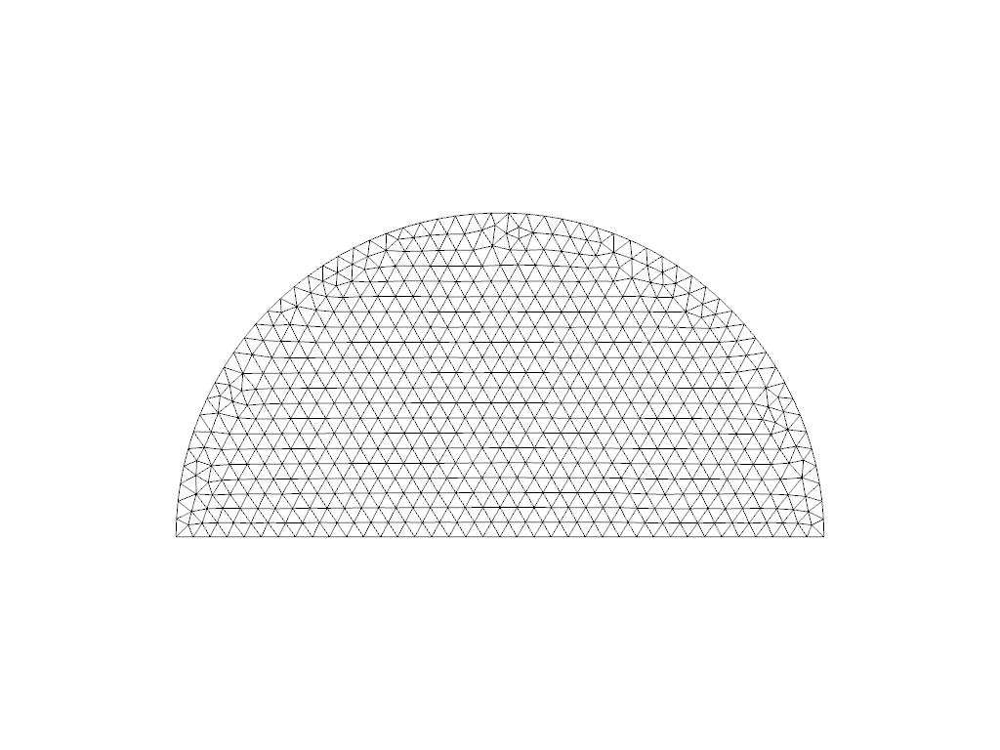

In [18]:
from lib_plot import *
plot_mesh_pyvista(V, mesh)
fric = 1 # coefficient of friction on cut boundary. 0 = no friction, 1 = moderate, 10 = strong, 100 = essentially fixed

0.0000


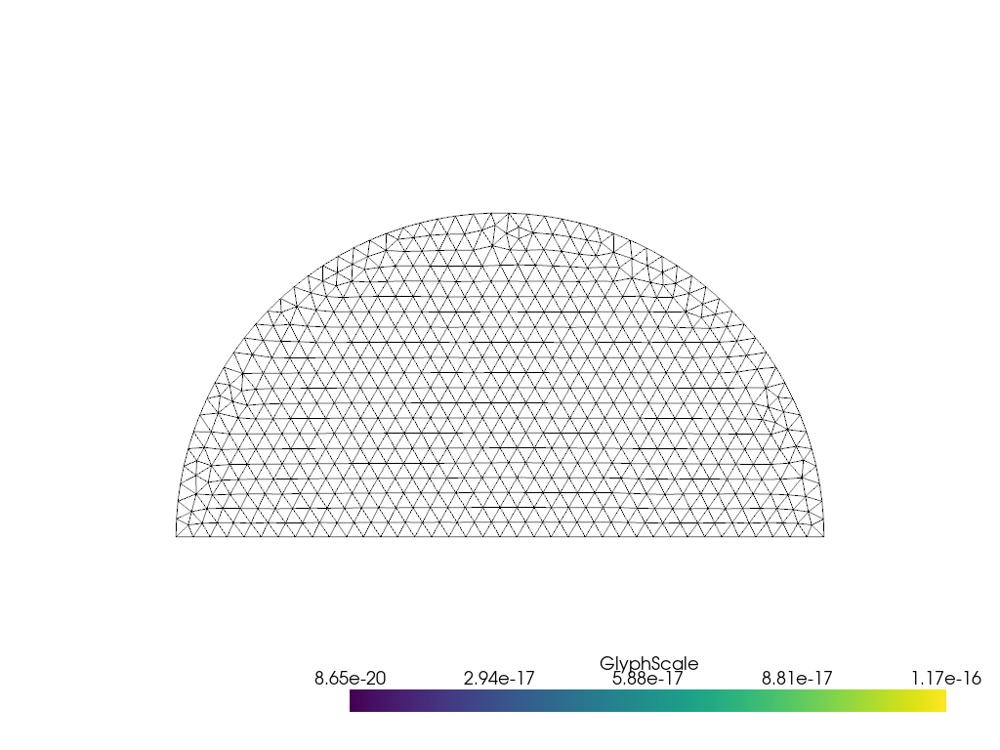

None

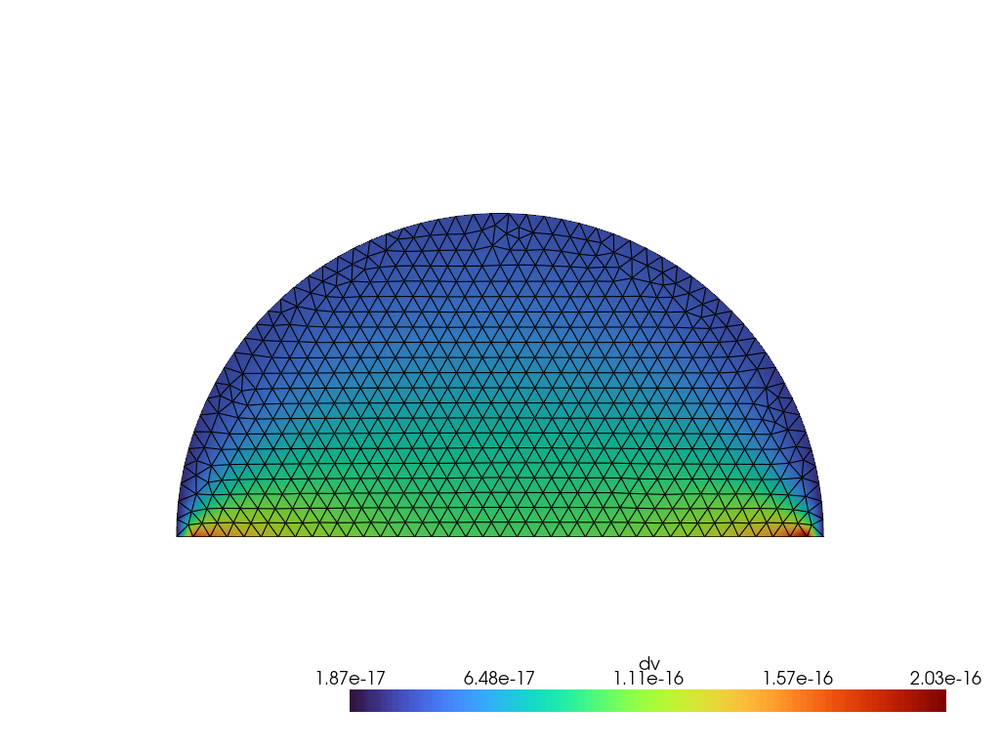

0.0100
0.0200
0.0300
0.0400
0.0500
0.0600
0.0700
0.0800
0.0900
0.1000
0.1100
0.1200
0.1300
0.1400
0.1500
0.1600
0.1700
0.1800
0.1900
0.2000
0.2100
0.2200
0.2300
0.2400
0.2500
0.2600
0.2700
0.2800
0.2900
0.3000
0.3100
0.3200
0.3300
0.3400
0.3500
0.3600
0.3700
0.3800
0.3900
0.4000
0.4100
0.4200
0.4300
0.4400
0.4500
0.4600
0.4700
0.4800
0.4900
0.5000


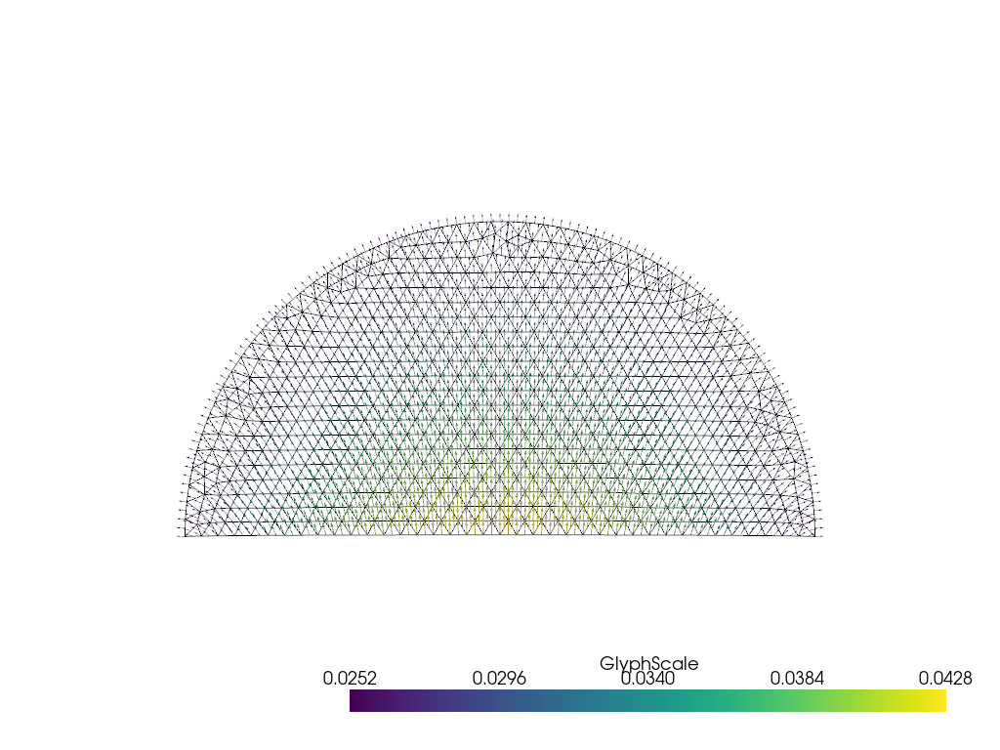

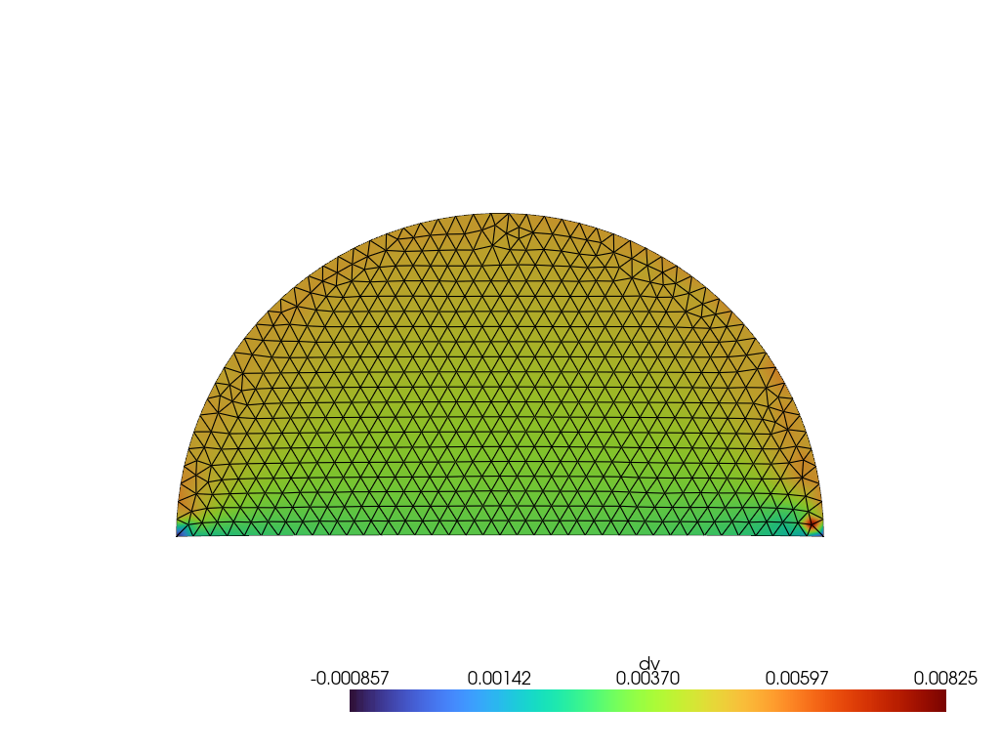

0.5100
0.5200
0.5300
0.5400
0.5500
0.5600
0.5700
0.5800
0.5900
0.6000
0.6100
0.6200
0.6300
0.6400
0.6500
0.6600
0.6700
0.6800
0.6900
0.7000
0.7100
0.7200
0.7300
0.7400
0.7500
0.7600
0.7700
0.7800
0.7900
0.8000
0.8100
0.8200
0.8300
0.8400
0.8500
0.8600
0.8700
0.8800
0.8900
0.9000
0.9100
0.9200
0.9300
0.9400
0.9500
0.9600
0.9700
0.9800
0.9900
1.0000


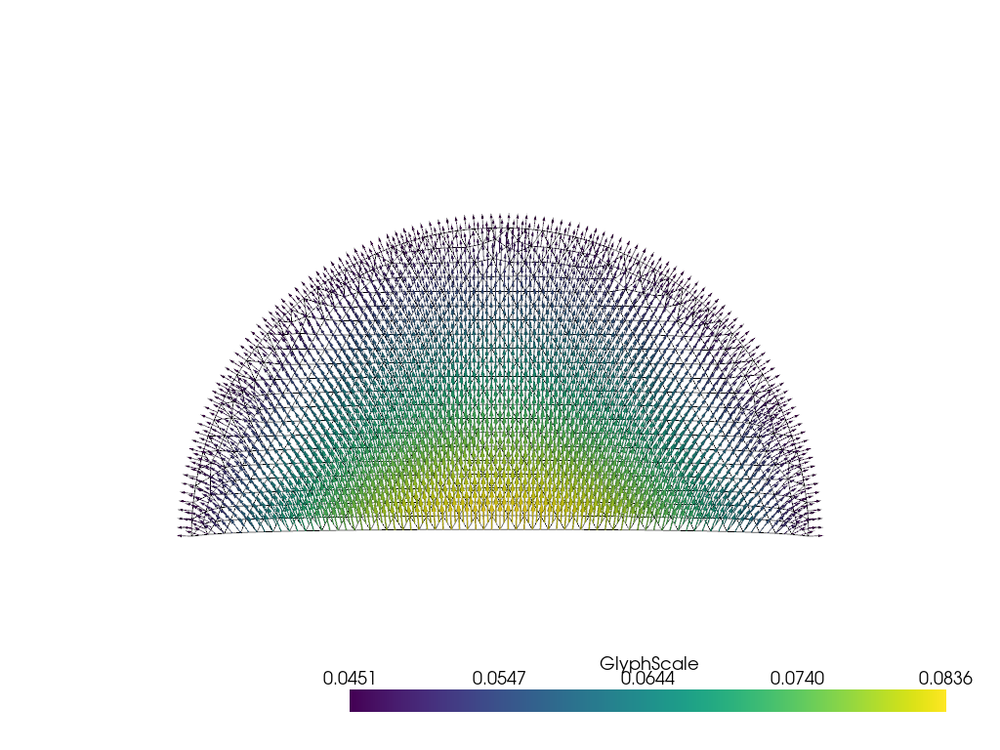

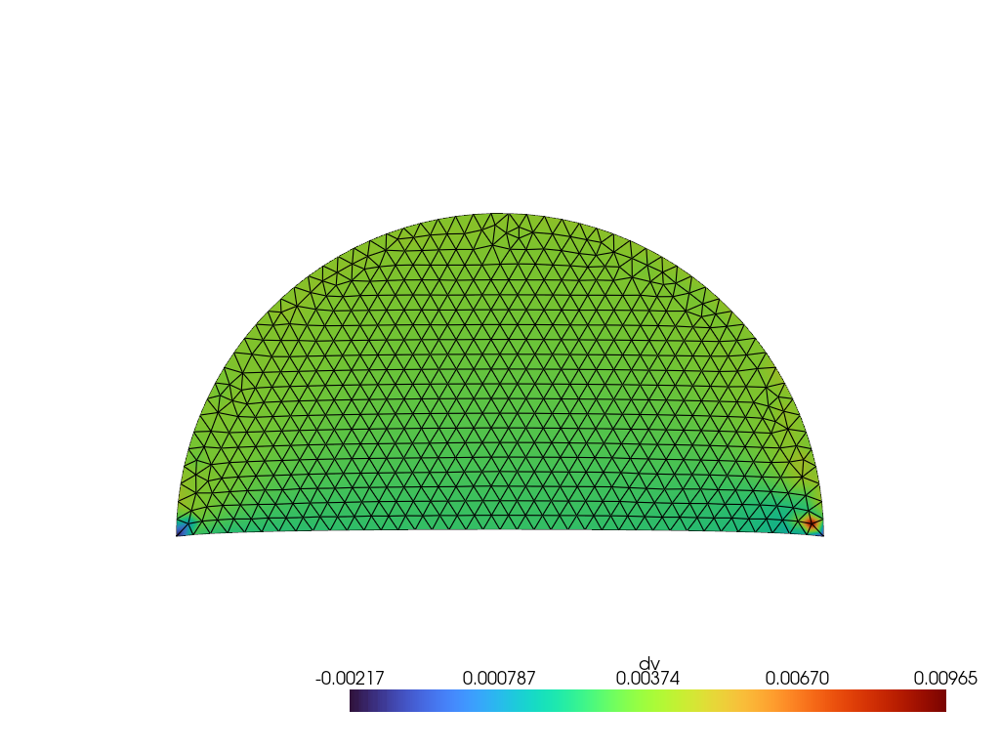

1.0100
1.0200
1.0300
1.0400
1.0500
1.0600
1.0700
1.0800
1.0900
1.1000
1.1100
1.1200
1.1300
1.1400
1.1500
1.1600
1.1700
1.1800
1.1900
1.2000
1.2100
1.2200
1.2300
1.2400
1.2500
1.2600
1.2700
1.2800
1.2900
1.3000
1.3100
1.3200
1.3300
1.3400
1.3500
1.3600
1.3700
1.3800
1.3900
1.4000
1.4100
1.4200
1.4300
1.4400
1.4500
1.4600
1.4700
1.4800
1.4900
1.5000


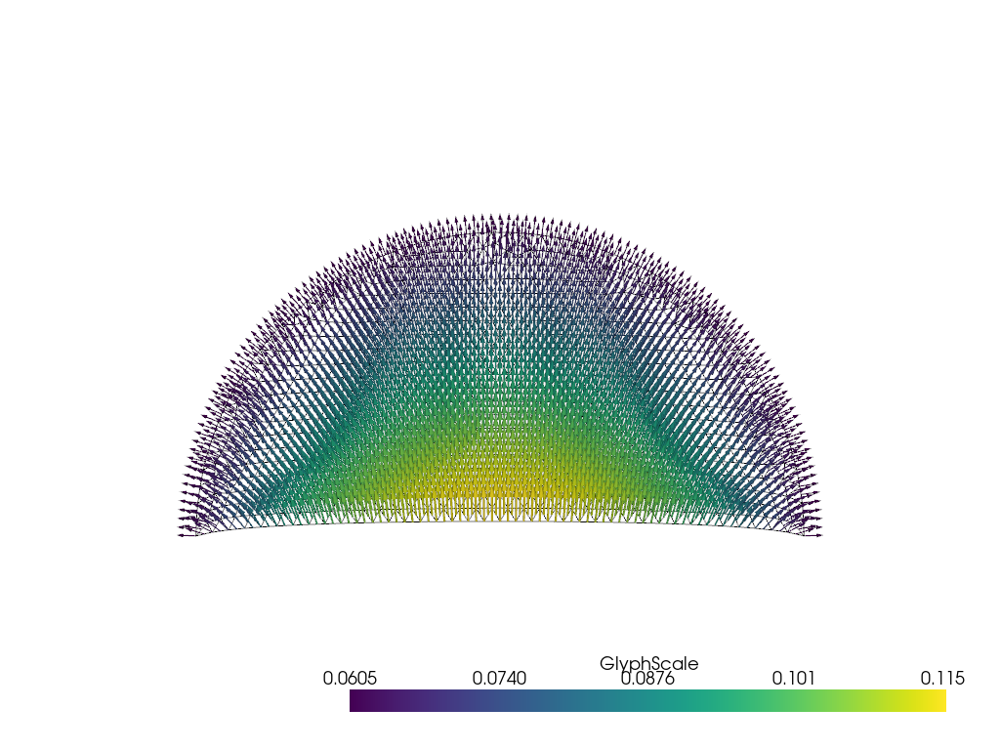

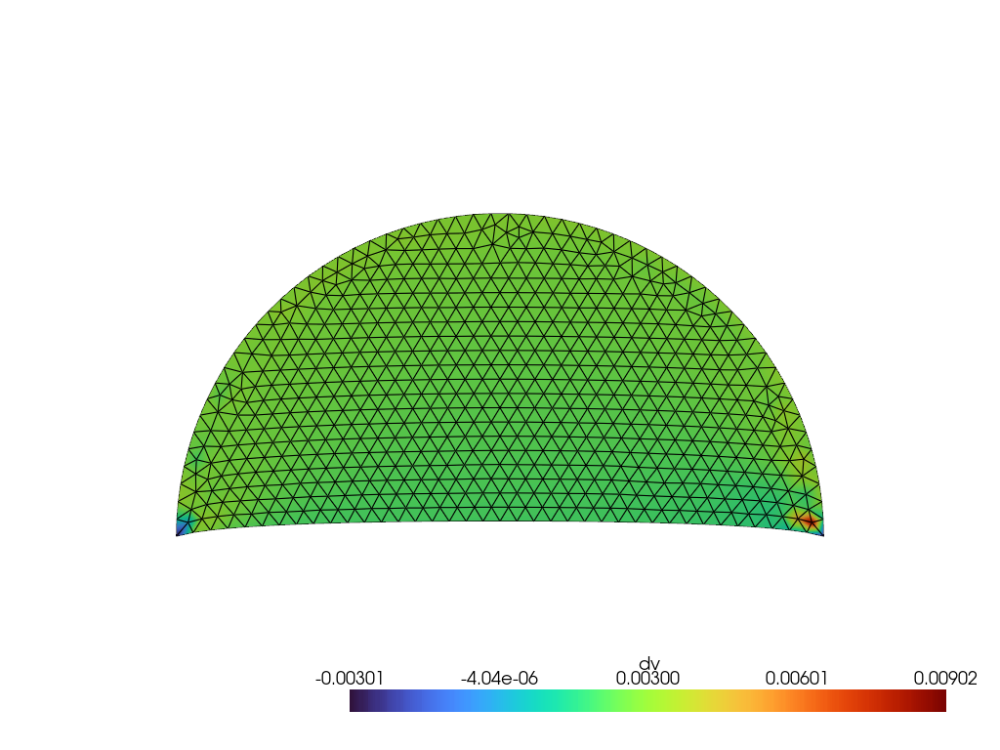

1.5100
1.5200
1.5300
1.5400
1.5500
1.5600
1.5700
1.5800
1.5900
1.6000
1.6100
1.6200
1.6300
1.6400
1.6500
1.6600
1.6700
1.6800
1.6900
1.7000
1.7100
1.7200
1.7300
1.7400
1.7500
1.7600
1.7700
1.7800
1.7900
1.8000
1.8100
1.8200
1.8300
1.8400
1.8500
1.8600
1.8700
1.8800
1.8900
1.9000
1.9100
1.9200
1.9300
1.9400
1.9500
1.9600
1.9700
1.9800
1.9900
2.0000


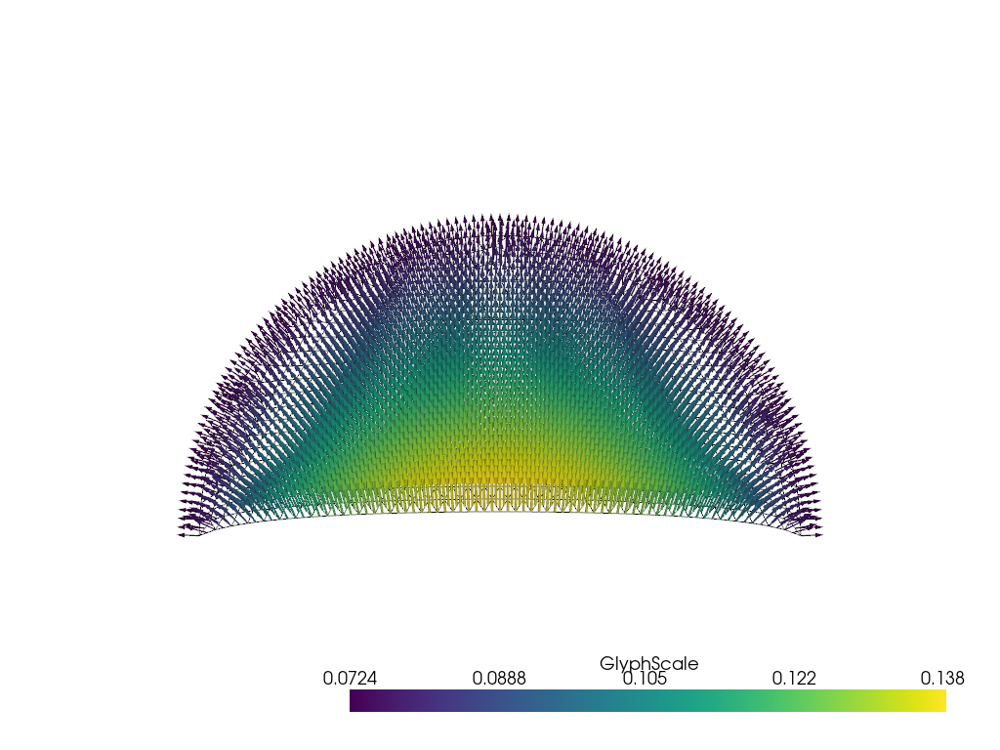

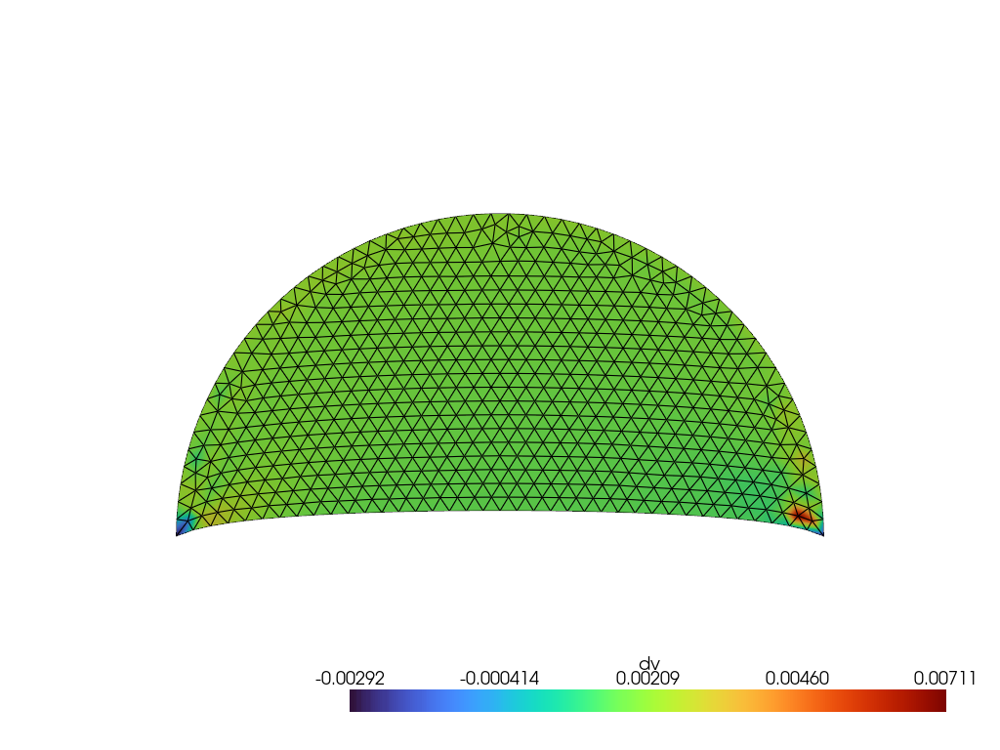

2.0100
2.0200
2.0300
2.0400
2.0500
2.0600
2.0700
2.0800
2.0900
2.1000
2.1100
2.1200
2.1300
2.1400
2.1500
2.1600
2.1700
2.1800
2.1900
2.2000
2.2100
2.2200
2.2300
2.2400
2.2500
2.2600
2.2700
2.2800
2.2900
2.3000
2.3100
2.3200
2.3300
2.3400
2.3500
2.3600
2.3700
2.3800
2.3900
2.4000
2.4100
2.4200
2.4300
2.4400
2.4500
2.4600
2.4700
2.4800
2.4900
2.5000


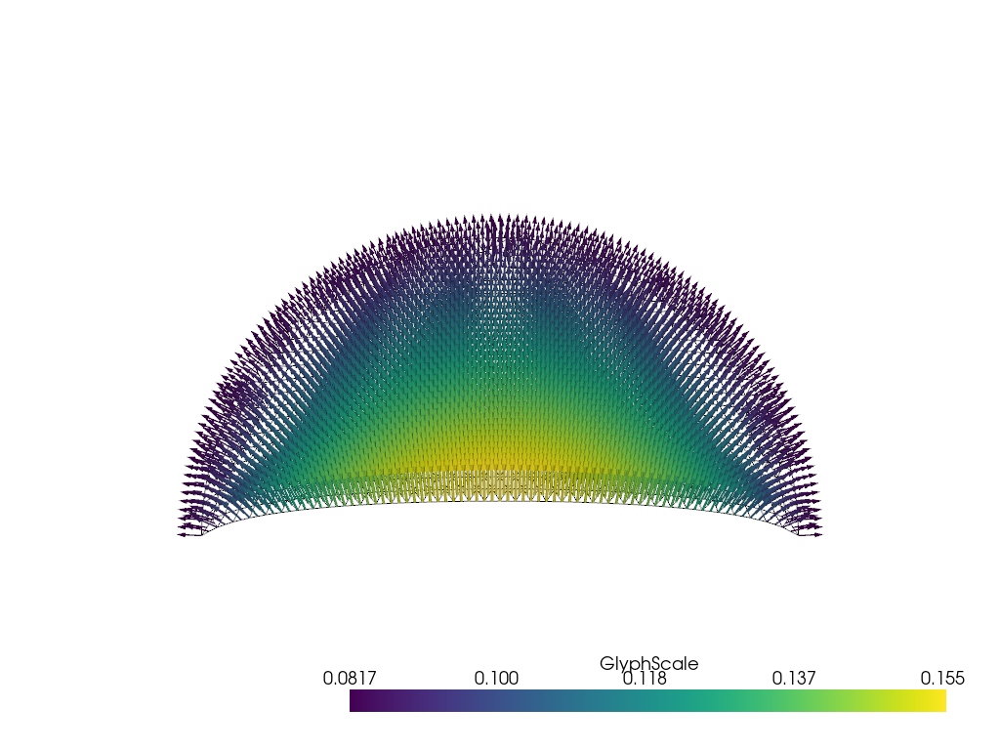

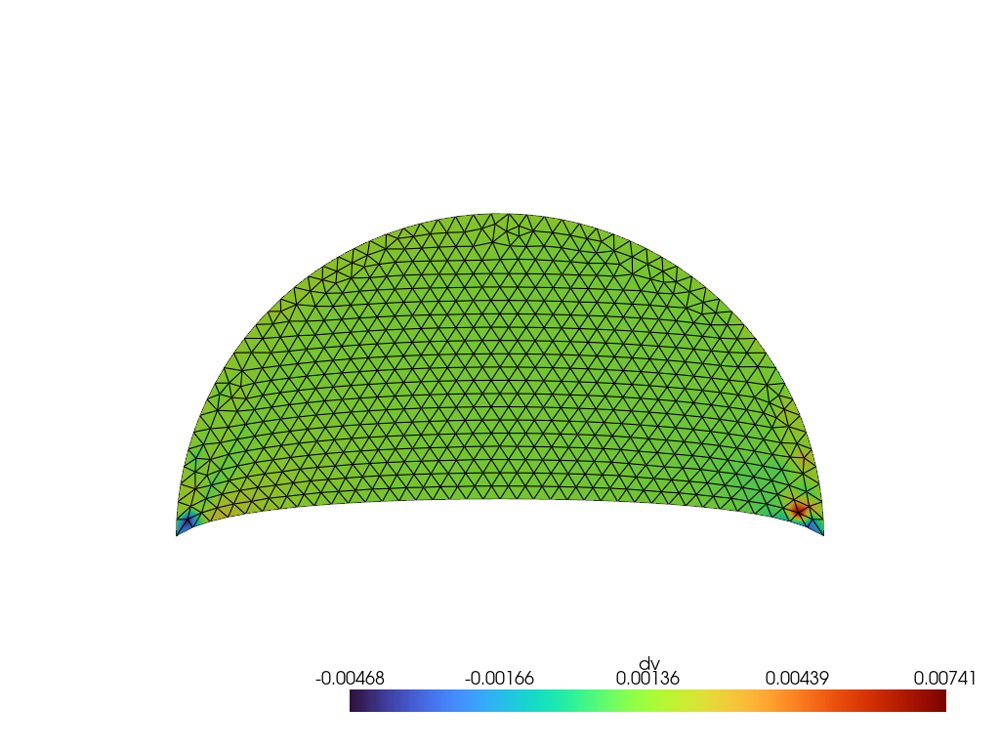

2.5100
2.5200
2.5300
2.5400
2.5500
2.5600
2.5700
2.5800
2.5900
2.6000
2.6100
2.6200
2.6300
2.6400
2.6500
2.6600
2.6700
2.6800
2.6900
2.7000
2.7100
2.7200
2.7300
2.7400
2.7500
2.7600
2.7700
2.7800
2.7900
2.8000
2.8100
2.8200
2.8300
2.8400
2.8500
2.8600
2.8700
2.8800
2.8900
2.9000
2.9100
2.9200
2.9300
2.9400
2.9500
2.9600
2.9700
2.9800
2.9900
3.0000


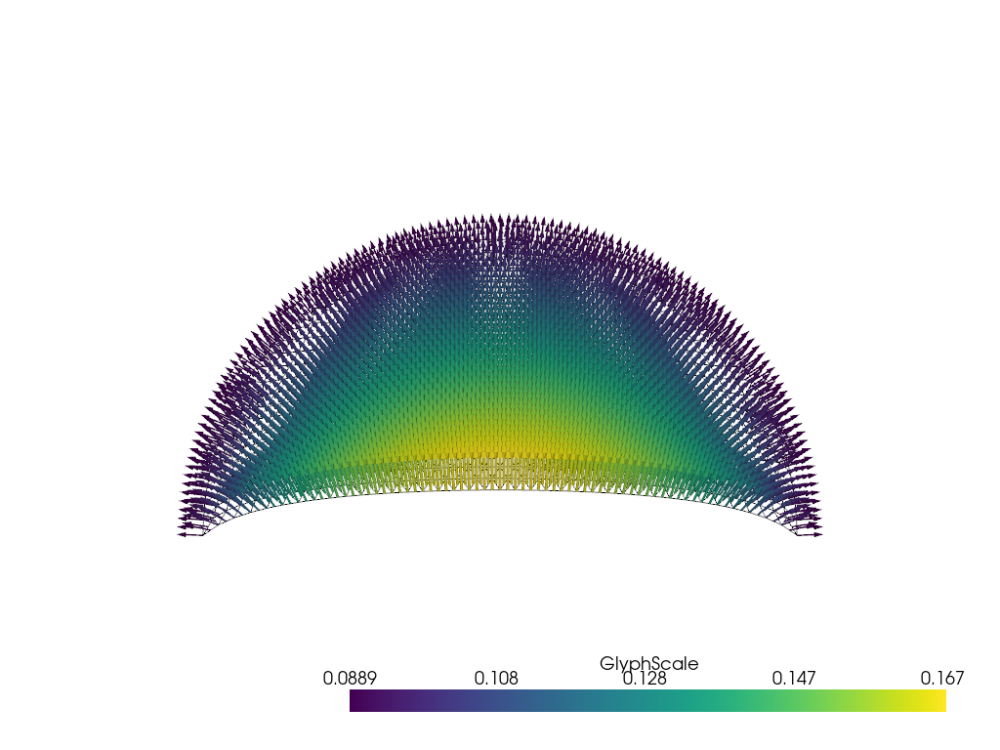

Context leak detected, msgtracer returned -1


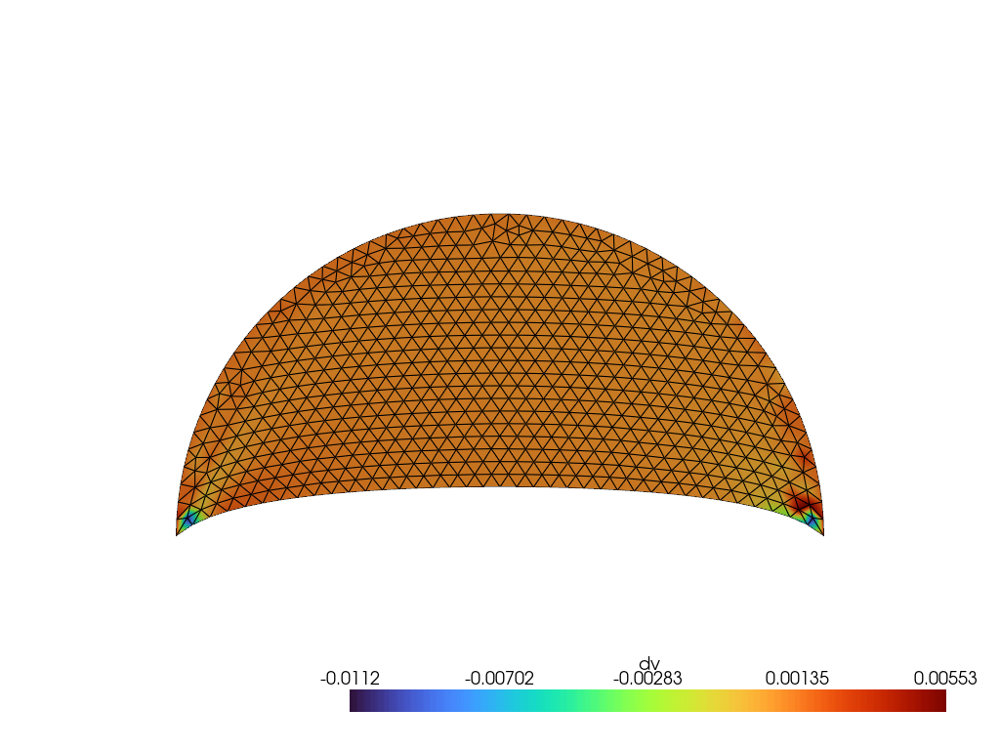

3.0100
3.0200
3.0300
3.0400
3.0500
3.0600
3.0700
3.0800
3.0900
3.1000
3.1100
3.1200
3.1300
3.1400
3.1500
3.1600
3.1700
3.1800
3.1900
3.2000
3.2100
3.2200
3.2300
3.2400
3.2500
3.2600
3.2700
3.2800
3.2900
3.3000
3.3100
3.3200
3.3300
3.3400
3.3500
3.3600
3.3700
3.3800
3.3900
3.4000
3.4100
3.4200
3.4300
3.4400
3.4500
3.4600
3.4700
3.4800
3.4900
3.5000


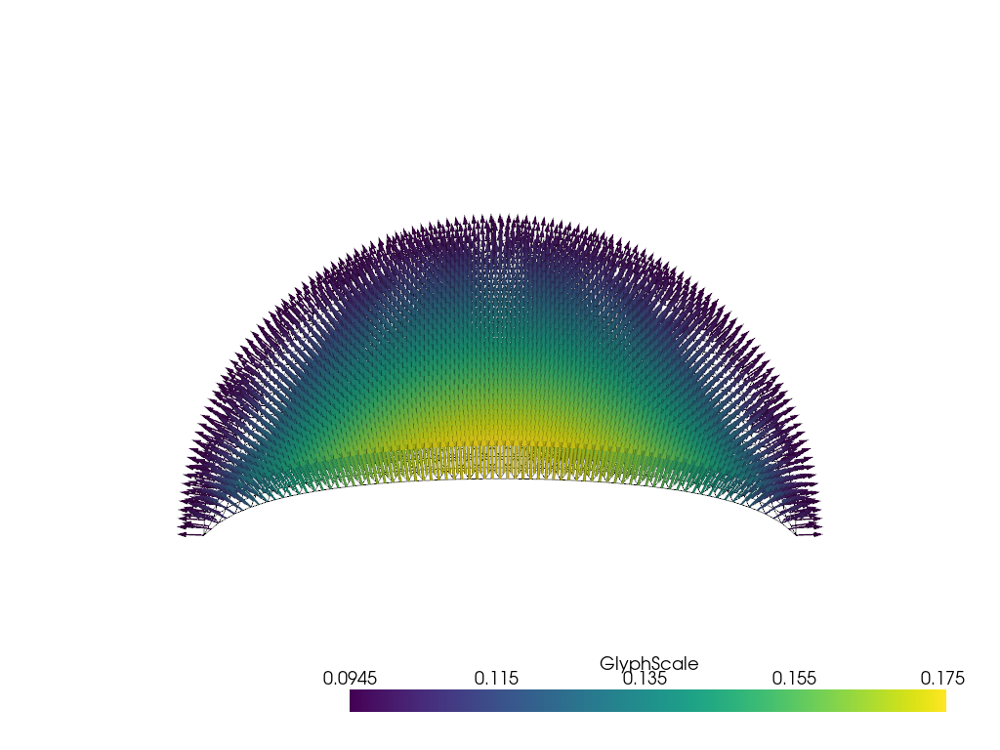

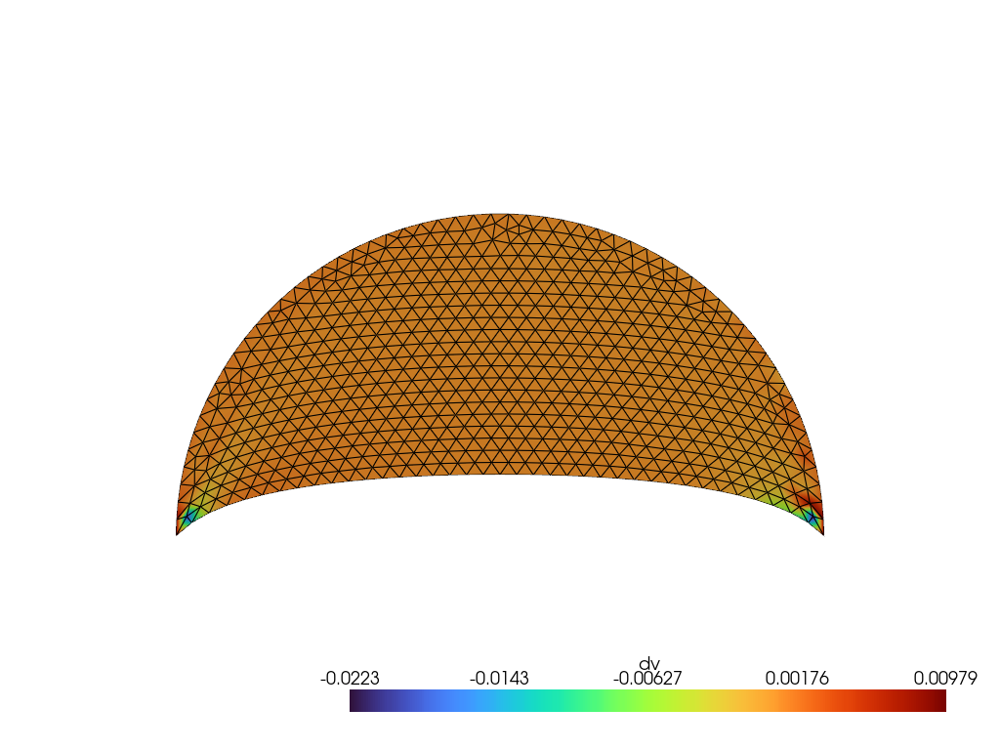

3.5100
3.5200
3.5300
3.5400
3.5500
3.5600
3.5700
3.5800
3.5900
3.6000
3.6100
3.6200
3.6300
3.6400
3.6500
3.6600
3.6700
3.6800
3.6900
3.7000
3.7100
3.7200
3.7300
3.7400
3.7500
3.7600
3.7700
3.7800
3.7900
3.8000
3.8100
3.8200
3.8300
3.8400
3.8500
3.8600
3.8700
3.8800
3.8900
3.9000
3.9100
3.9200
3.9300
3.9400
3.9500
3.9600
3.9700
3.9800
3.9900
4.0000


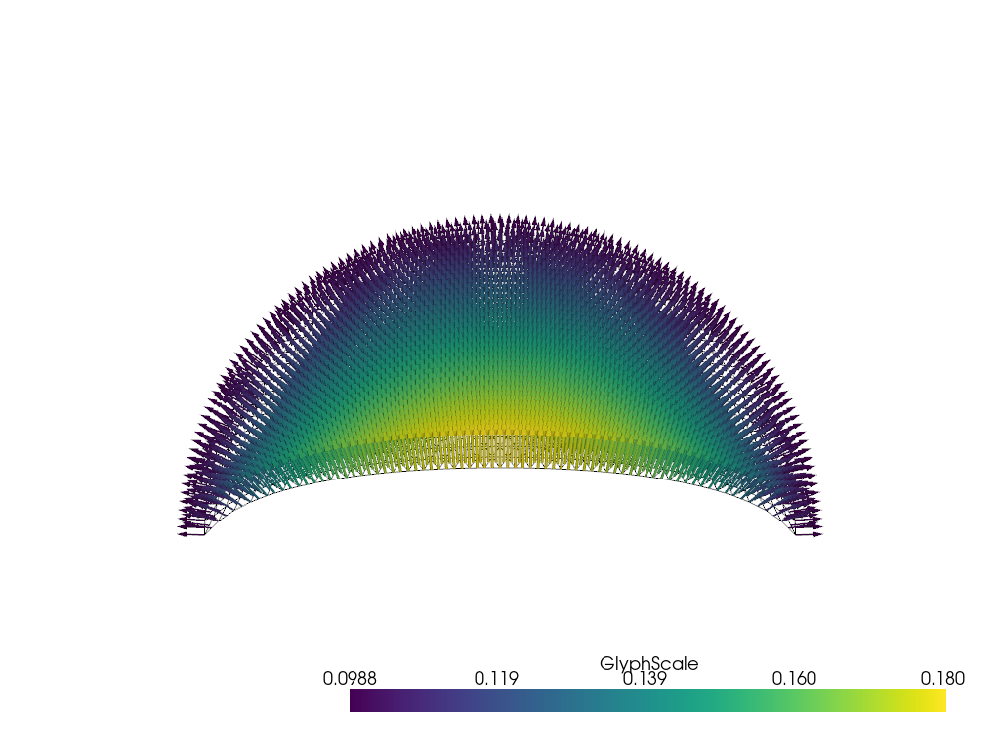

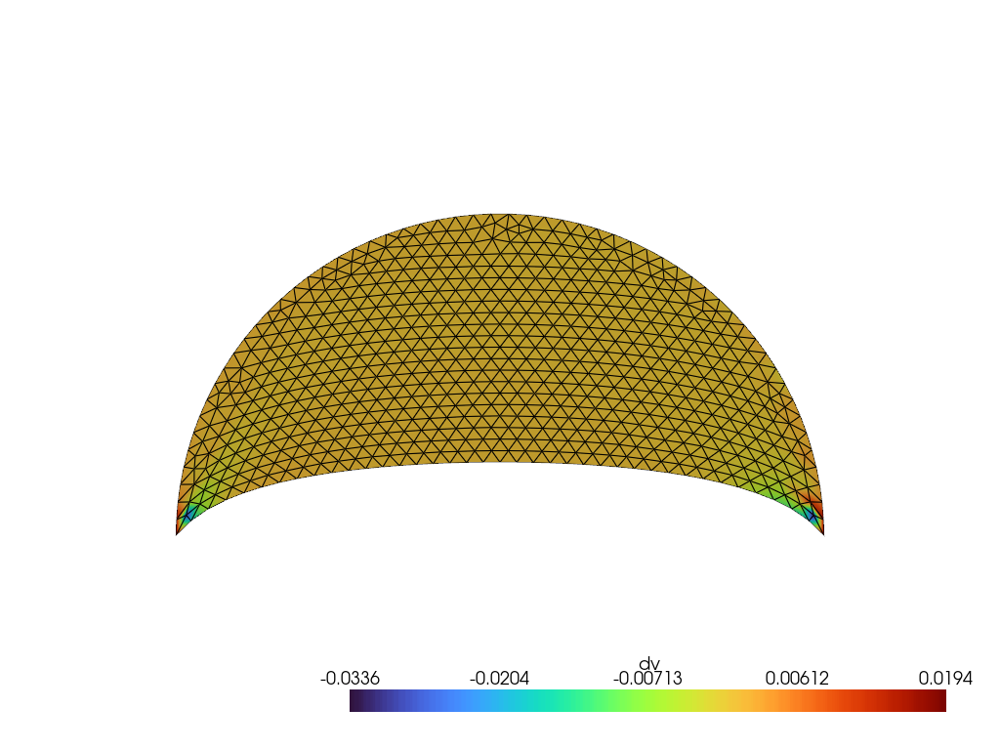

4.0100
4.0200
4.0300
4.0400
4.0500
4.0600
4.0700
4.0800
4.0900
4.1000
4.1100
4.1200
4.1300
4.1400
4.1500
4.1600
4.1700
4.1800
4.1900
4.2000
4.2100
4.2200
4.2300
4.2400
4.2500
4.2600
4.2700
4.2800
4.2900
4.3000
4.3100
4.3200
4.3300
4.3400
4.3500
4.3600
4.3700
4.3800
4.3900
4.4000
4.4100
4.4200
4.4300
4.4400
4.4500
4.4600
4.4700
4.4800
4.4900
4.5000


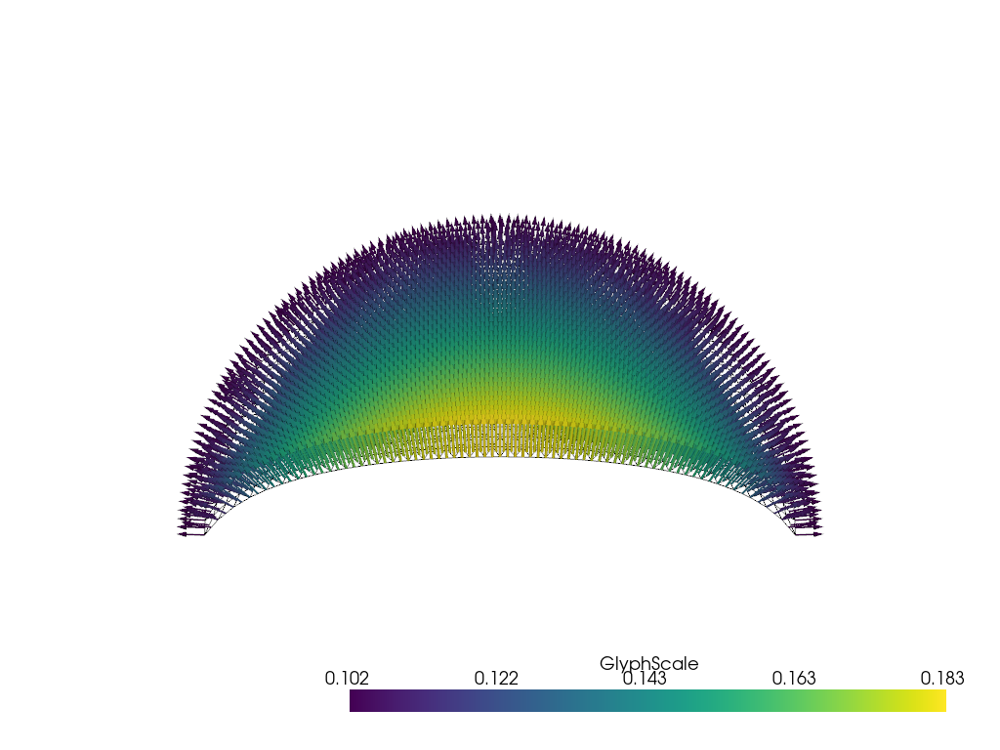

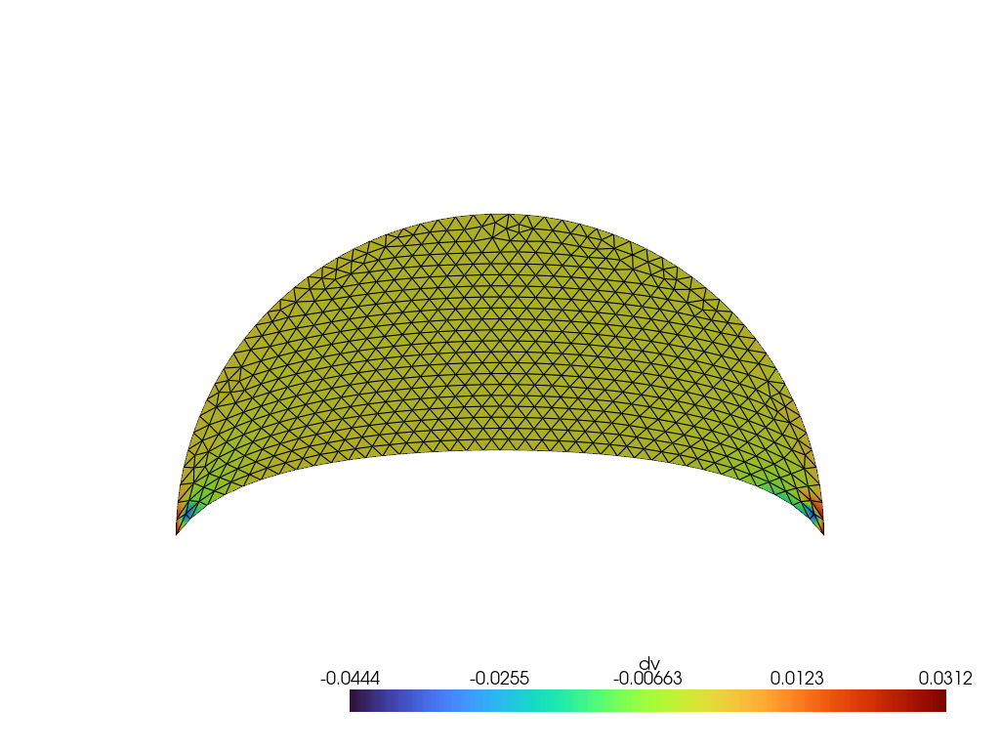

4.5100
4.5200
4.5300
4.5400
4.5500
4.5600
4.5700
4.5800
4.5900
4.6000
4.6100
4.6200
4.6300
4.6400
4.6500
4.6600
4.6700
4.6800
4.6900
4.7000
4.7100
4.7200
4.7300
4.7400
4.7500
4.7600
4.7700
4.7800
4.7900
4.8000
4.8100
4.8200
4.8300
4.8400
4.8500
4.8600
4.8700
4.8800
4.8900
4.9000
4.9100
4.9200
4.9300
4.9400
4.9500
4.9600
4.9700
4.9800
4.9900
5.0000


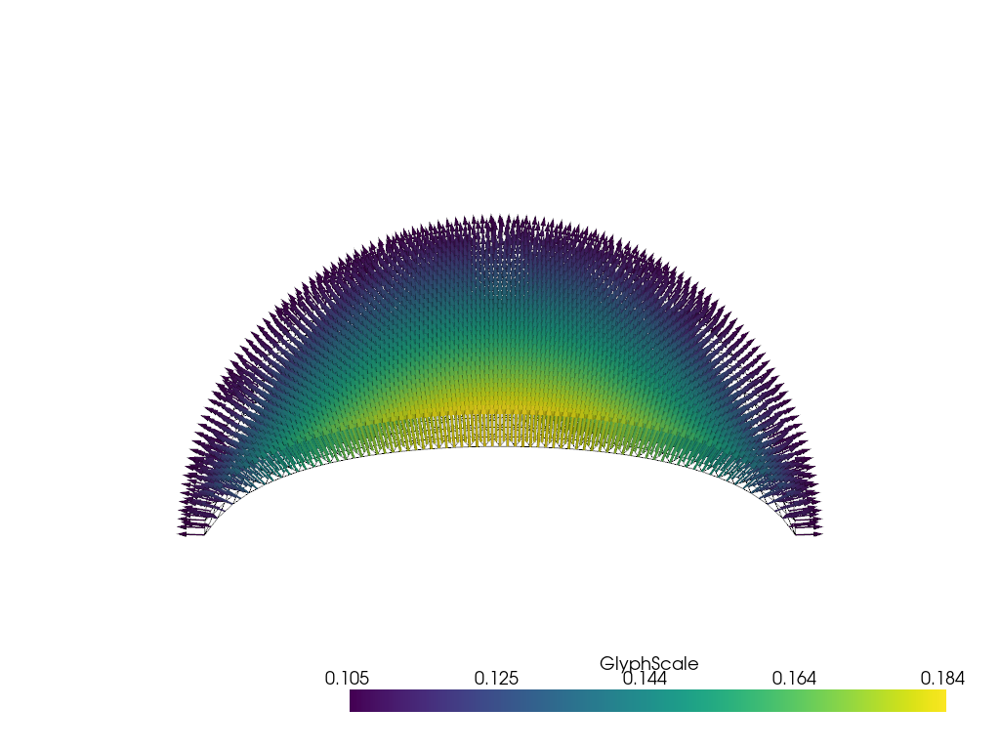

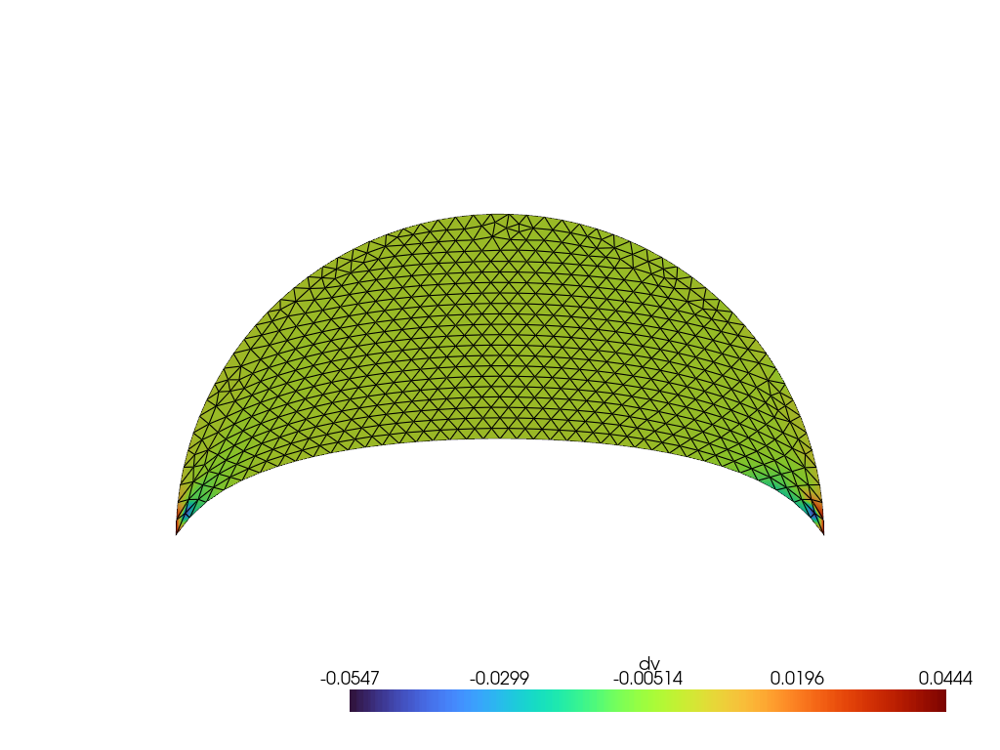

5.0100
5.0200
5.0300
5.0400
5.0500
5.0600
5.0700
5.0800
5.0900
5.1000
5.1100
5.1200
5.1300
5.1400
5.1500
5.1600
5.1700
5.1800
5.1900
5.2000
5.2100
5.2200
5.2300
5.2400
5.2500
5.2600
5.2700
5.2800
5.2900
5.3000
5.3100
5.3200
5.3300
5.3400
5.3500
5.3600
5.3700
5.3800
5.3900
5.4000
5.4100
5.4200
5.4300
5.4400
5.4500
5.4600
5.4700
5.4800
5.4900
5.5000


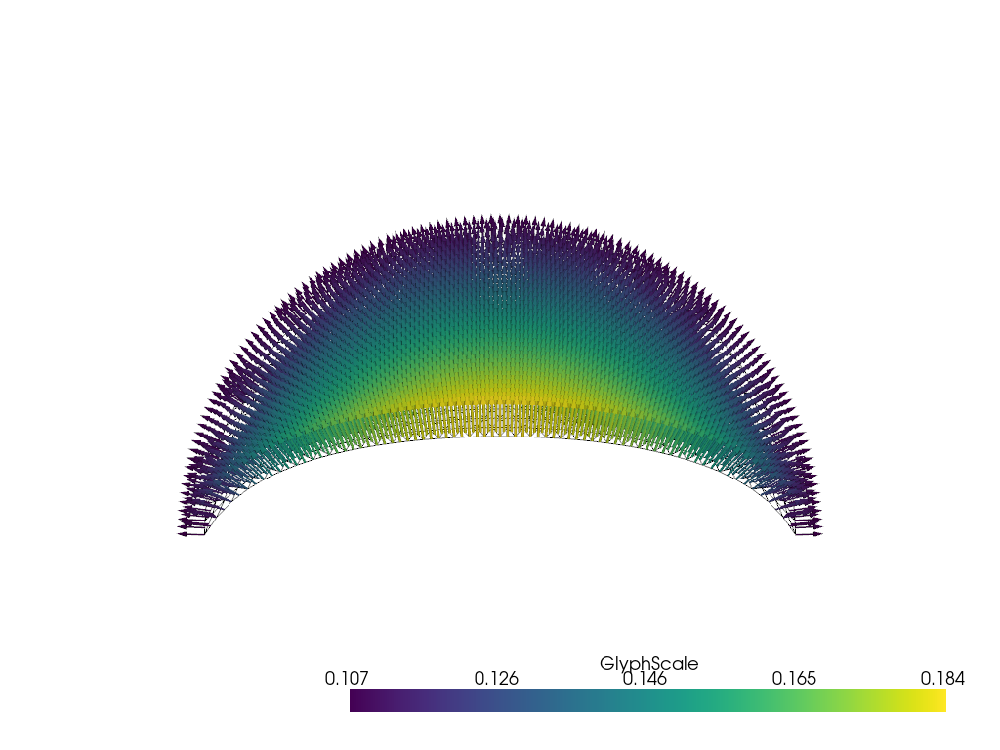

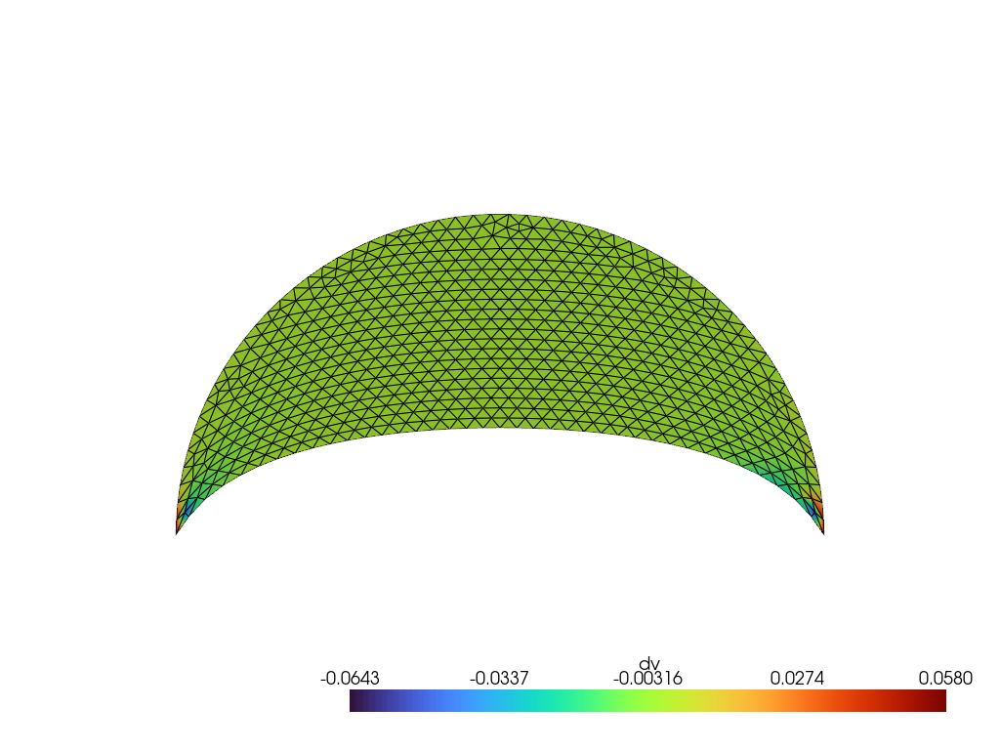

5.5100
5.5200
5.5300
5.5400
5.5500
5.5600
5.5700
5.5800
5.5900
5.6000
5.6100
5.6200
5.6300
5.6400
5.6500
5.6600
5.6700
5.6800
5.6900
5.7000
5.7100
5.7200
5.7300
5.7400
5.7500
5.7600
5.7700
5.7800
5.7900
5.8000
5.8100
5.8200
5.8300
5.8400
5.8500
5.8600
5.8700
5.8800
5.8900
5.9000
5.9100
5.9200
5.9300
5.9400
5.9500
5.9600
5.9700
5.9800
5.9900
6.0000


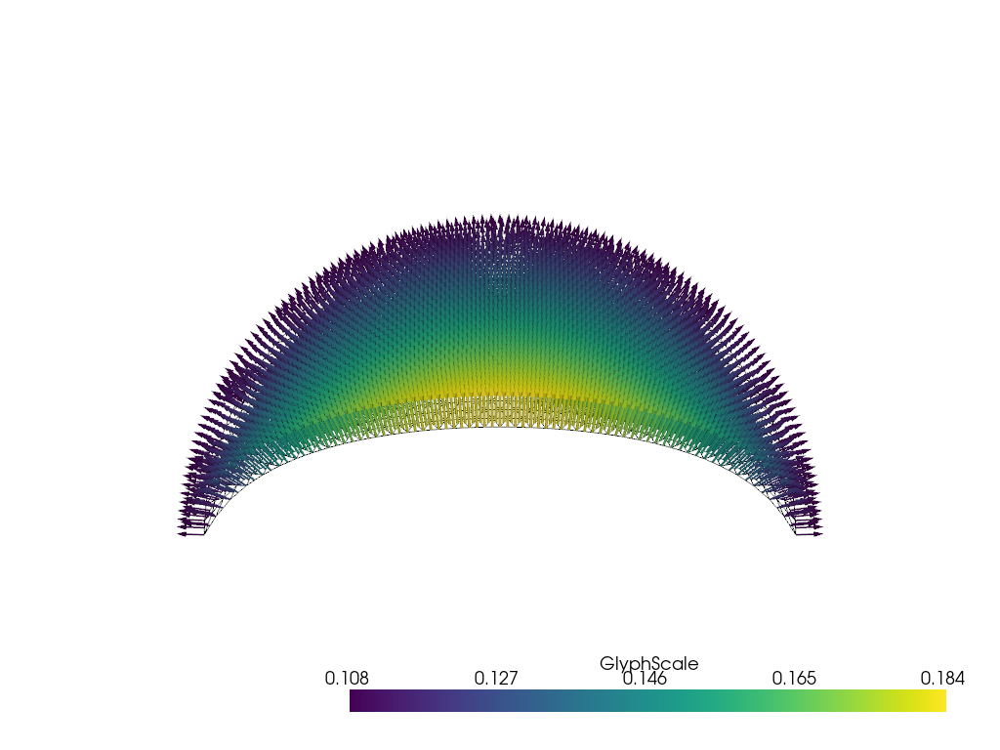

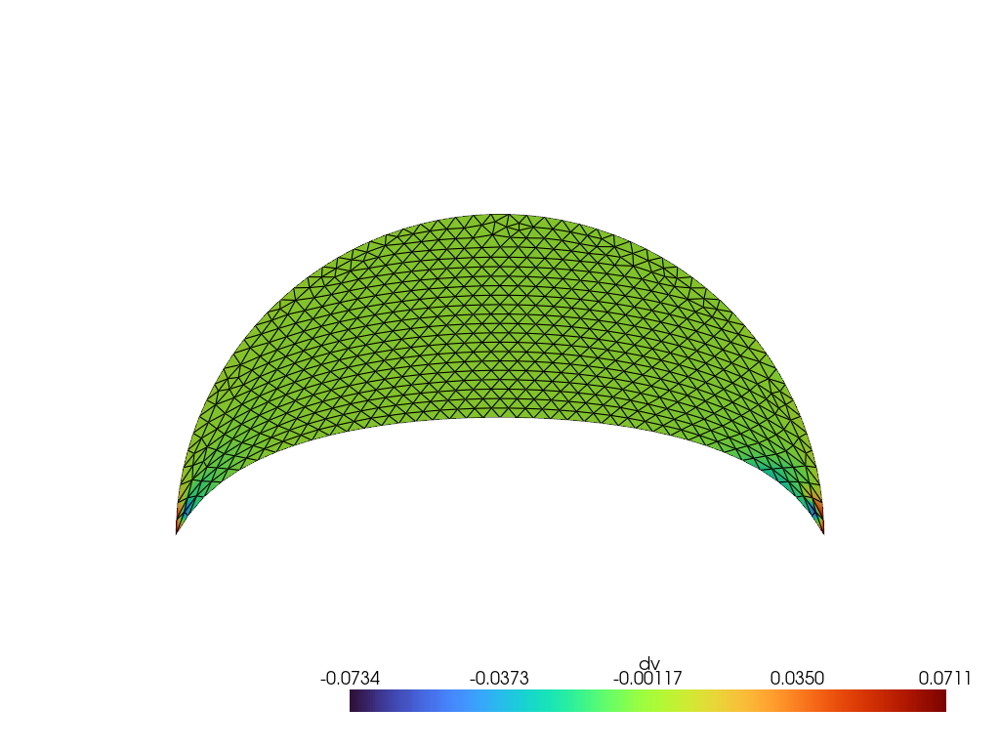

In [19]:
'''Loop'''
for j in range(nrep):
    print(f'{t:.4f}')

    if np.isclose(t,ablation_time):
        #reduce time step to 1/10th of the original time step after edge is cut
        dt = dt / HR
        plotinterval = HR
    
    '''Solve FEM'''

    #Calculate active stress object
    stressobj = get_stressobj(margin_geom,np.min([t,ablation_time]),N,mu,d,ten_profile,baseline_tension,interpolators,l,cumt,t_dep)
    stressobj1D = get_stressobj1D(margin_geom,np.min([t,ablation_time]),N,mu,d,ten_profile,baseline_tension,interpolators,l,cumt,t_dep)

    #obtain velocity and accumulated area changes
    v, vn = VE_femsolve_ant(t,U,V,N,mesh,meshtags,markers,Ms,coefs,fric,stressobj,stressobj1D,acc_ing,tissue_parameters,fem_settings,el_parameters,hypothesis,ablation_time,solver)
    if not remesh:
        v_sol.x.array[:] = v.x.array[:]
    
    '''Process solution'''    
    #Evaluate v at margin points (using redefined margin)
    #v_values = vel_on_margin(v,ps,mesh,N)
    
    if j==0:
        vtxs = init_writers(dataDir,U,Rho,v_sol,Dv,mesh)
    
    #Calculate extension rate
    #margvel, gd = calc_exrate(v_values,ta,l,N)

    '''Save and display output'''

    #save output
    if output:
        save_fem(mesh,str(j),dataDir,U,v,Rho,Dv) #saves velocities, densities, and displacement to xdmf files
        #dataout = save_marg(dataout,t,T,c,gd,l,ps,margvel)
        
        #write to vtx
        for vtx in vtxs:
            vtx.write(t)

    #plot flow and divergence
    if (j % plotinterval == 0):
        plot_flow_pyvista(mesh,v,V,scale=2,newfig = not j) #plot velocity
        plot_div_pyvista(v,None,mesh,1,option=0,THorder=1)#,clim=[-0.5, 0.5]) #instantaneous divergence of the flow
        #plot_p_pyvista(Dv,mesh,1,THorder=1)#,clim=[0.8, 1.2]) #accumulated area changes
        pass

    '''Time step margin'''

    #time-step margin coordinates, myosin and tension
    #ps, c, T = regulate_margin(N,ps,v_values,gd,c,lt,T,None,None,None,regulation_parameters,regulation_settings,dt,mu,ten_profile,baseline_tension,t)

    #update quantities derived from new margin position
    #margin_geom, l, lt, cumt, th, ta = updatelengths(ps,N)
    #interpolators = interp_init(cumt,c,T,th)
    
    '''Time step mesh (remesh if desired)'''
    
    for sdiv in range(subd):
        ddt = dt/subd
        Rho, U = evolve_densities_and_displacement(mesh,U,Rho,R,v,ddt)
        Dv = calc_div(mesh,U,R,Dv)
        #move mesh and update radius
        mesh = move_mesh(mesh,v,ddt)
        #Update radius
        currentradius+=ddt*vn 
    
    #remesh if desired
    if remesh and ((j+1) % remeshinterval == 0) and (t < ablation_time):
        #Redefine margin
        margin_geom, ps, l, lt, cumt, th, ta, c, T, interpolators = redef_margin(N,margin_geom,l,cumt,interpolators)
        #Redefine mesh
        currentradius = det_newradius_retract(mesh) #trim currentradius to fit new mesh into old mesh
        newmesh, meshtags, markers = mso_meshing(N,meshres,currentradius,ps)
        #Interpolate Epiboly and state variables
        Ms = epiboly_remesh(newmesh,mesh,Ms,THorder)
        U = displacement_remesh(newmesh,mesh,U,THorder)
        Rho = density_remesh(newmesh,mesh,Rho,THorder)
        #Define new function spaces
        V, R = create_function_spaces(newmesh)
        Dv = calc_div(newmesh,U,R) #re-calculate divergence just in case
        #drop old mesh
        mesh = newmesh
   
    #update time step
    t += dt

    #Update contraction coefficients
    coefs = update_coefs(mesh,t)
    acc_ing = accum_ingression(np.min([t,ablation_time]),mesh)

#Close output files
for vtx in vtxs:
    vtx.close()

#save_output(dataDir,dataout,'Margin_data')